In [2]:
import pandas as pd
import numpy  as np
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium import plugins
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor 
from sklearn.metrics import mean_squared_error,r2_score
from sklearn import metrics

from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor 
import xgboost as xgb
import lightgbm as lgb

In [3]:
data=pd.read_csv('./air.csv')

In [4]:
#understand data
data.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [5]:
data['neighbourhood_group'].unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

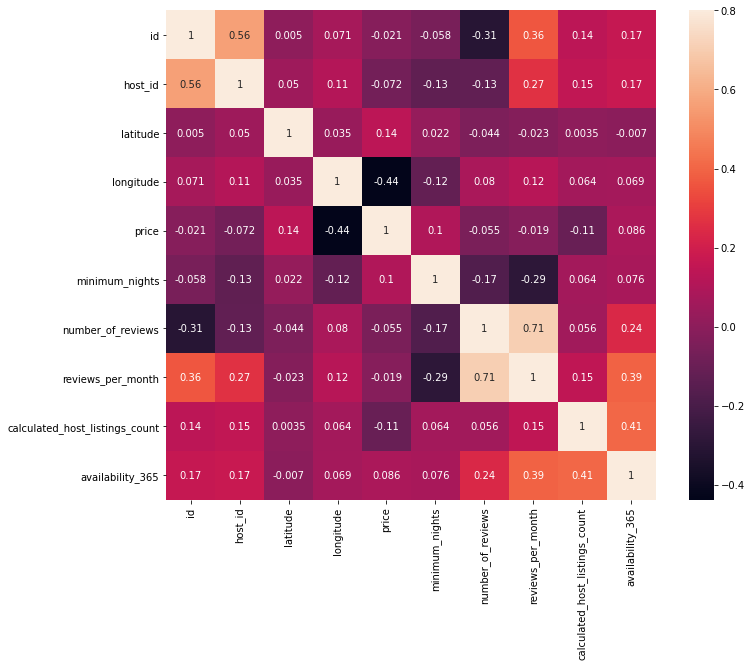

In [8]:
#Afficher la Corrélation entre les different variables  
corrmat = data.corr(method='spearman')
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True, annot=True);

# Data Viz

In [9]:

#Showing rent price per position in map
rentPriceMap = data[["latitude", "longitude","price"]]
#reduce length of data {CPU dead T_T}
rentPriceMap=rentPriceMap[:10000]

#Map putting start point at new city and zoom at 10
m = folium.Map([40.767937,-73.982155 ], zoom_start=10)

# mark each station as a point
for index, row in rentPriceMap.iterrows():
    #making circle for heat map {adding $ to the price}
    folium.CircleMarker([row['latitude'], row['longitude']],
                        radius=5,
                        popup=str(row['price'])+'$',
                        fill_color="#3db7e4", 
                       ).add_to(m)
    
    
rentPriceMap = rentPriceMap[['latitude', 'longitude']].to_numpy()
# plot heatmap
m.add_child(plugins.HeatMap(rentPriceMap, radius=25))
m


/home/mehdibalbali/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='neighbourhood_group', ylabel='price'>

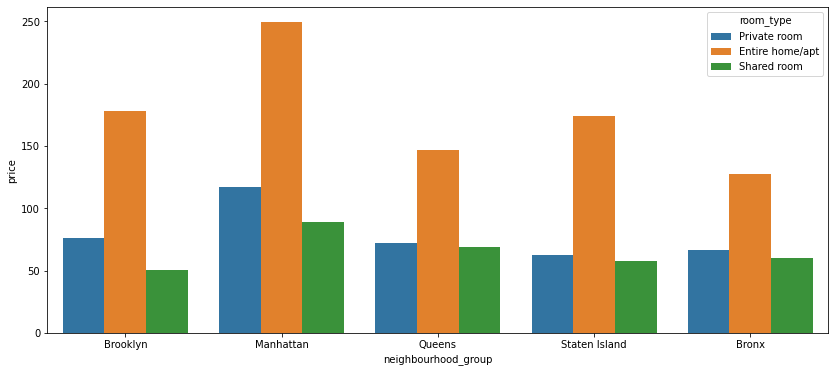

In [13]:
#print price/neighbourhood_group {room_type}
plt.figure(figsize=(14, 6))
sns.barplot(data.neighbourhood_group, data.price, hue=data.room_type, ci=None)

/home/mehdibalbali/.local/lib/python3.8/site-packages/pandas/plotting/_matplotlib/tools.py:400: MatplotlibDeprecationWarning: 
The is_first_col function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use ax.get_subplotspec().is_first_col() instead.
  if ax.is_first_col():
/home/mehdibalbali/.local/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


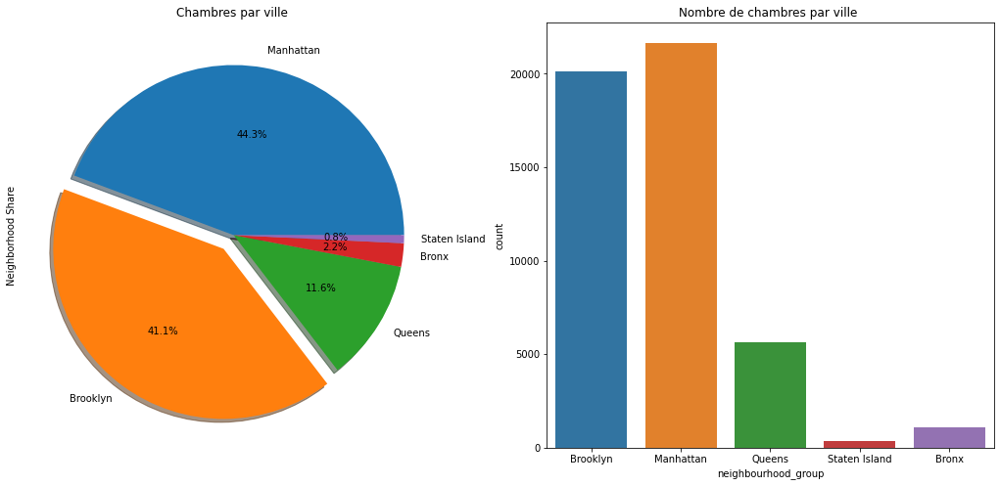

In [21]:
f, ax = plt.subplots(1,2,figsize=(18,8))
data['neighbourhood_group'].value_counts().plot.pie(explode=[0,0.1,0,0,0],autopct='%1.1f%%',ax=ax[0],shadow=True)
ax[0].set_title('Chambres par ville ')
ax[0].set_ylabel('Neighborhood Share')
sns.countplot('neighbourhood_group',data=data,ax=ax[1])
ax[1].set_title('Nombre de chambres par ville ')
plt.show()

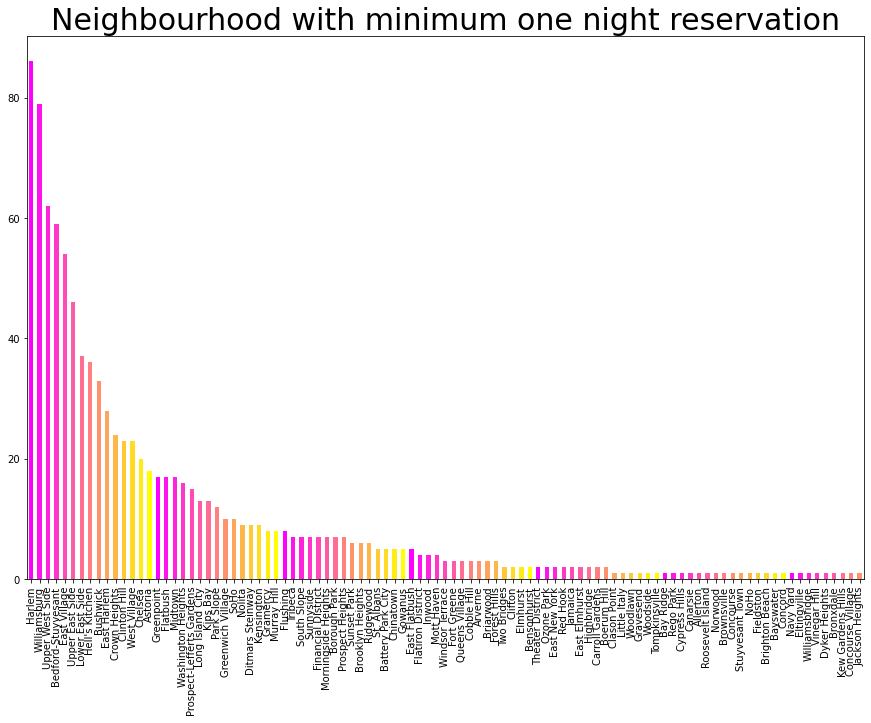

In [23]:
#plot neighbourhood with minimum one night reservation

neighbourhood=data.loc[data['minimum_nights'] == 1]
neighbourhood=neighbourhood['neighbourhood']
color = plt.cm.spring(np.linspace(0, 1, 15))
neighbourhood[:1000].value_counts().plot.bar(color = color, figsize = (15, 10))

plt.title('Neighbourhood with minimum one night reservation',fontsize = 30)

plt.xticks(rotation = 90)
plt.show()

# Data cleaning

In [11]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [12]:
#verifier le nombre de valeurs null dans chaque case 

In [13]:
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In [78]:
dataclean = data[["neighbourhood_group",'latitude', 'longitude',"room_type","minimum_nights","reviews_per_month","price"]]
dataclean

,neighbourhood_group,latitude,longitude,room_type,minimum_nights,reviews_per_month,price
0,Brooklyn,40.64749,-73.97237,Private room,1,0.21,149
1,Manhattan,40.75362,-73.98377,Entire home/apt,1,0.38,225
2,Manhattan,40.80902,-73.94190,Private room,3,NaN,150
3,Brooklyn,40.68514,-73.95976,Entire home/apt,1,4.64,89
4,Manhattan,40.79851,-73.94399,Entire home/apt,10,0.10,80
...,...,...,...,...,...,...,...
48890,Brooklyn,40.67853,-73.94995,Private room,2,NaN,70
48891,Brooklyn,40.70184,-73.93317,Private room,4,NaN,40
48892,Manhattan,40.81475,-73.94867,Entire home/apt,10,NaN,115
48893,Manhattan,40.75751,-73.99112,Shared room,1,NaN,55


In [79]:
#make sure that we don't have NaN columns
dataclean=dataclean.dropna()
dataclean.describe()

,latitude,longitude,minimum_nights,reviews_per_month,price
count,38843.000000,38843.000000,38843.000000,38843.000000,38843.000000
mean,40.728134,-73.951148,5.868059,1.373221,142.317947
std,0.054990,0.046695,17.384784,1.680442,196.945624
min,40.506410,-74.244420,1.000000,0.010000,0.000000
25%,40.688640,-73.982470,1.000000,0.190000,69.000000
50%,40.721710,-73.954800,2.000000,0.720000,101.000000
75%,40.762990,-73.935020,4.000000,2.020000,170.000000
max,40.913060,-73.712990,1250.000000,58.500000,10000.000000


In [80]:
#verifing 
dataclean.isnull().sum()

neighbourhood_group    0
latitude               0
longitude              0
room_type              0
minimum_nights         0
reviews_per_month      0
price                  0
dtype: int64

# Feature Engineering

In [81]:
#Encoding neighbourhood_group and room_type
le                                 = preprocessing.LabelEncoder()
dataclean2                         = dataclean
dataclean['neighbourhood_group']  = le.fit_transform(dataclean['neighbourhood_group'])
dataclean2['room_type']            = le.fit_transform(dataclean2['room_type'])

<ipython-input-81-2de5ead116f2>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataclean['neighbourhood_group']  = le.fit_transform(dataclean['neighbourhood_group'])
<ipython-input-81-2de5ead116f2>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dataclean2['room_type']            = le.fit_transform(dataclean2['room_type'])


In [82]:
dataclean2

,neighbourhood_group,latitude,longitude,room_type,minimum_nights,reviews_per_month,price
0,1,40.64749,-73.97237,1,1,0.21,149
1,2,40.75362,-73.98377,0,1,0.38,225
3,1,40.68514,-73.95976,0,1,4.64,89
4,2,40.79851,-73.94399,0,10,0.10,80
5,2,40.74767,-73.97500,0,3,0.59,200
...,...,...,...,...,...,...,...
48782,2,40.78099,-73.95366,1,1,1.00,129
48790,3,40.75104,-73.81459,1,1,1.00,45
48799,4,40.54179,-74.14275,1,1,1.00,235
48805,0,40.80787,-73.92400,0,1,2.00,100


# Model Tunning

In [83]:
X = dataclean2[[col for col in list(dataclean2.columns) if col != 'price'] ]
y = dataclean2['price']
X_train, X_test, Y_train, Y_test = train_test_split(X,y,random_state = 42, test_size = 0.3) 

In [84]:
dataclean2.head()

,neighbourhood_group,latitude,longitude,room_type,minimum_nights,reviews_per_month,price
0,1,40.64749,-73.97237,1,1,0.21,149
1,2,40.75362,-73.98377,0,1,0.38,225
3,1,40.68514,-73.95976,0,1,4.64,89
4,2,40.79851,-73.94399,0,10,0.10,80
5,2,40.74767,-73.97500,0,3,0.59,200


In [85]:
lin_model = LinearRegression().fit(X_train, Y_train)
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))
print("\n")

# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))

The model performance for training set
--------------------------------------
RMSE is 188.4525352134543
R2 score is 9.278281443784554


The model performance for testing set
--------------------------------------
RMSE is 185.00590652773303
R2 score is 9.792697304564724


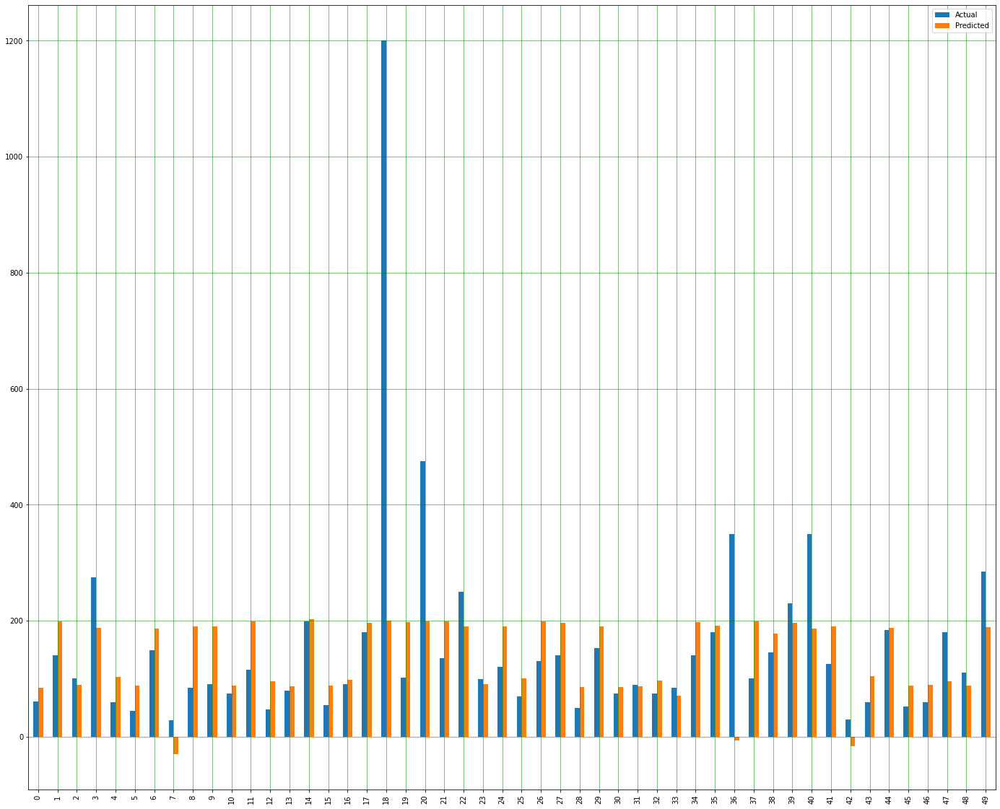

In [36]:
error_frame = pd.DataFrame({'Actual': np.array(Y_test).flatten(), 'Predicted': y_test_predict.flatten()})
df1 = error_frame[:50]
df1.plot(kind='bar',figsize=(24,20))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

# Model Validation

In [87]:
Q1 = dataclean2.quantile(0.25)
Q3 = dataclean2.quantile(0.75)
IQR = Q3 - Q1
IQR_df = dataclean2[~((dataclean2 < (Q1 - 1.5 * IQR)) |(dataclean2 > (Q3 + 1.5 * IQR))).any(axis=1)]


In [88]:
Y = IQR_df['price']
X = IQR_df[['neighbourhood_group', 'room_type']]
X = preprocessing.normalize(X)
X = np.hstack((np.ones( (len(IQR_df['price']) ,1)), X))


X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2)

In [89]:
lin_model = LinearRegression().fit(X_train, Y_train)
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))
print("\n")

# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2*100))

The model performance for training set
--------------------------------------
RMSE is 50.95867035967725
R2 score is 39.32387641383247


The model performance for testing set
--------------------------------------
RMSE is 51.22174741023669
R2 score is 37.523084335985814


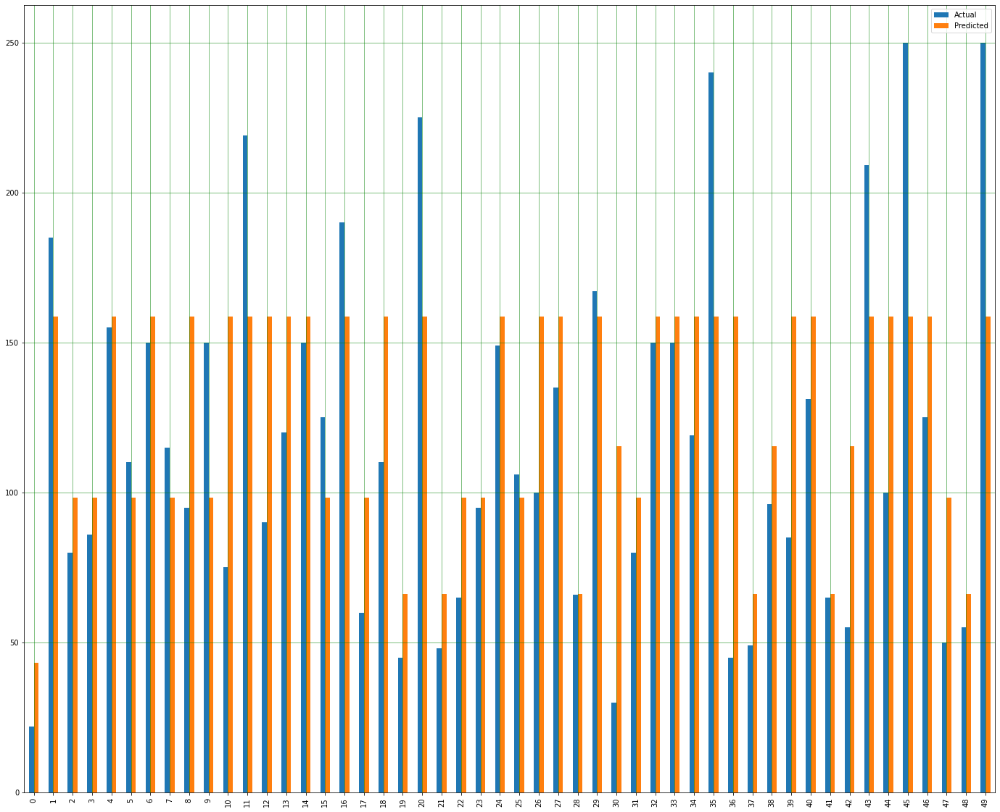

In [90]:
error_frame = pd.DataFrame({'Actual': np.array(Y_test).flatten(), 'Predicted': y_test_predict.flatten()})
df1 = error_frame[:50]
df1.plot(kind='bar',figsize=(24,20))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [91]:
clf = LogisticRegression(random_state=42,max_iter=1000).fit(X_train, Y_train)

In [92]:
y_train_predict = clf.predict(X_train)
clf.score(X_train, Y_train)

0.0683656606071149

In [93]:
predictions = lin_model.predict(X_test)

In [94]:
mae = metrics.mean_absolute_error(Y_test, predictions)
mse = metrics.mean_squared_error(Y_test, predictions)
rmse = np.sqrt(metrics.mean_squared_error(Y_test, predictions))
r2 = metrics.r2_score(Y_test, predictions)

print('MAE (Mean Absolute Error): %s' %mae)
print('MSE (Mean Squared Error): %s' %mse)
print('RMSE (Root mean squared error): %s' %rmse)
print('R2 score: %s' %r2)

MAE (Mean Absolute Error): 38.896462102105836
MSE (Mean Squared Error): 2623.6674077580888
RMSE (Root mean squared error): 51.22174741023669
R2 score: 0.3752308433598581


In [95]:
error = pd.DataFrame({'Actual Values': np.array(Y_test).flatten(), 'Predicted Values': predictions.flatten()})
error.head(10)

,Actual Values,Predicted Values
0,22,43.187883
1,185,158.752285
2,80,98.175151
3,86,98.175151
4,155,158.752285
5,110,98.175151
6,150,158.752285
7,115,98.175151
8,95,158.752285
9,150,98.175151


In [117]:
x = dataclean[["neighbourhood_group",'latitude', 'longitude',"minimum_nights","reviews_per_month","price"]]

y = dataclean['price']
y2 = np.log1p(dataclean['price'])

scaler = StandardScaler()
x = scaler.fit_transform(x)

X_train,X_test,Y_train,Y_test=train_test_split(x,y,test_size=.1,random_state=7)
x_train1,x_test1,y_train1,y_test1=train_test_split(x,y2,test_size=.1,random_state=7)


In [118]:
#regression linéere 
model = LinearRegression()
model.fit(X_train, Y_train)
Y_pred = model.predict(X_test)

print('R2 :' + str(r2_score(Y_test, Y_pred)))
print('MAE: ' + str((mean_absolute_error(Y_test, Y_pred))))
print('MSE: ' + str(np.sqrt(mean_squared_error(Y_test, Y_pred))))

R2 :1.0
MAE: 1.044287493601807e-13
MSE: 1.6354593167241327e-13


In [119]:
#Decision Tree
model = DecisionTreeRegressor()
model.fit(X_train, Y_train)
y_pred1 = model.predict(X_test)

print('R2  :' + str(r2_score(Y_test, y_pred1)))
print('MAE :' + str(mean_absolute_error(Y_test, y_pred1)))
print('MSE :' + str(np.sqrt(mean_squared_error(Y_test, y_pred1))))

R2  :0.9891481083688579
MAE :0.2803088803088803
MSE :16.060879993072177


In [120]:
#Random Forest Regressor
model = RandomForestRegressor(n_estimators = 100, random_state = 0) 
model.fit(X_train, Y_train)
y_pred1 = model.predict(X_test)

print('R2 : ' + str(r2_score(Y_test, y_pred1)))
print('MAE : ' + str(mean_absolute_error(Y_test, y_pred1)))
print('MSE : ' + str(np.sqrt(mean_squared_error(Y_test, y_pred1))))

R2 : 0.9997215827378833
MAE : 0.06667696267696252
MSE : 2.5725551400348983


In [121]:
#XGB Regressor
XGB = xgb.XGBRegressor(colsample_bytree=0.2, gamma=0.0, 
                             learning_rate=0.05, max_depth=6, 
                             min_child_weight=1.5, n_estimators=7200,
                             reg_alpha=0.9, reg_lambda=0.6,
                             subsample=0.2,seed=42)
XGB.fit(X_train, Y_train)
y_pred1 = XGB.predict(X_test)

print('R2 : ' + str(r2_score(Y_test, y_pred1)))
print('MAE : ' + str(mean_absolute_error(Y_test, y_pred1)))
print('MSE : ' + str(np.sqrt(mean_squared_error(Y_test, y_pred1))))

R2 : 0.9966982349392683
MAE : 2.4890982529678247
MSE : 8.859101892594182


In [122]:
LightGB = lgb.LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=5, objective=None,
              random_state=3461, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)
LightGB.fit(X_train, Y_train)
y_pred1 = LightGB.predict(X_test)

print('R2 : ' + str(r2_score(Y_test, y_pred1)))
print('MAE : ' + str(mean_absolute_error(Y_test, y_pred1)))
print('MSE : ' + str(np.sqrt(mean_squared_error(Y_test, y_pred1))))

R2 : 0.9549042323849334
MAE : 2.292475726020609
MSE : 32.7404394932934
